In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import zipfile
import matplotlib.pyplot as plt
import cv2 as cv

In [3]:
!wget  https://sid.erda.dk/public/archives/ff17dc924eba88d5d01a807357d6614c/TrainIJCNN2013.zip

--2024-11-17 07:37:32--  https://sid.erda.dk/public/archives/ff17dc924eba88d5d01a807357d6614c/TrainIJCNN2013.zip
Resolving sid.erda.dk (sid.erda.dk)... 130.225.104.13
Connecting to sid.erda.dk (sid.erda.dk)|130.225.104.13|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1104177081 (1.0G) [application/zip]
Saving to: ‘TrainIJCNN2013.zip’

TrainIJCNN2013.zip  100%[===================>]   1.03G  28.0MB/s    in 38s     

2024-11-17 07:38:11 (27.5 MB/s) - ‘TrainIJCNN2013.zip’ saved [1104177081/1104177081]



In [4]:
with zipfile.ZipFile("/content/TrainIJCNN2013.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/")

(800, 1360, 3)


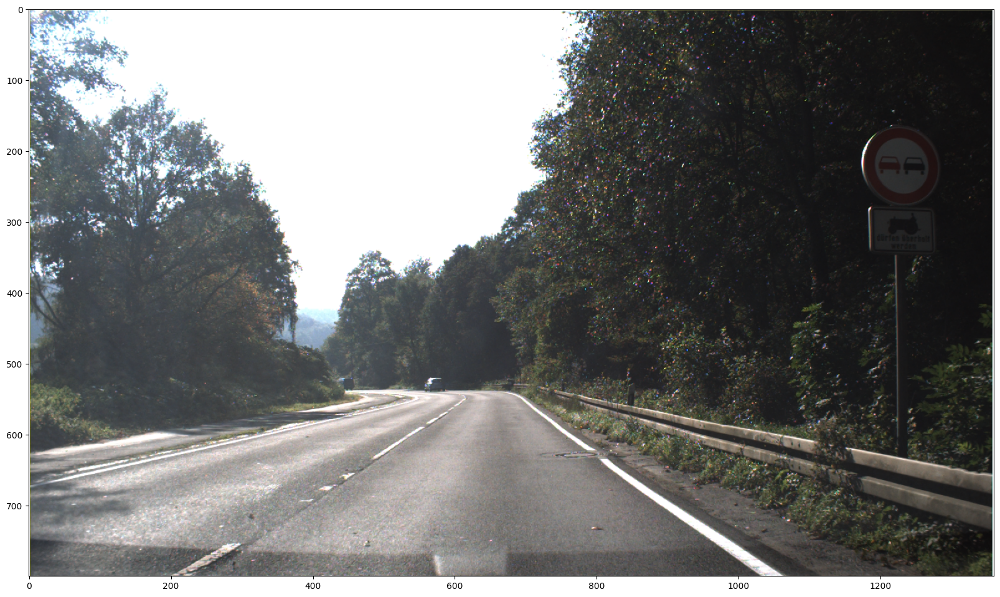

In [5]:
im=cv.imread("/content/TrainIJCNN2013/00005.ppm",1)
print(im.shape)
im=cv.cvtColor(im,cv.COLOR_BGR2RGB)
H=im.shape[0]
W=im.shape[1]
plt.figure(figsize=(20,20))
plt.imshow(im)

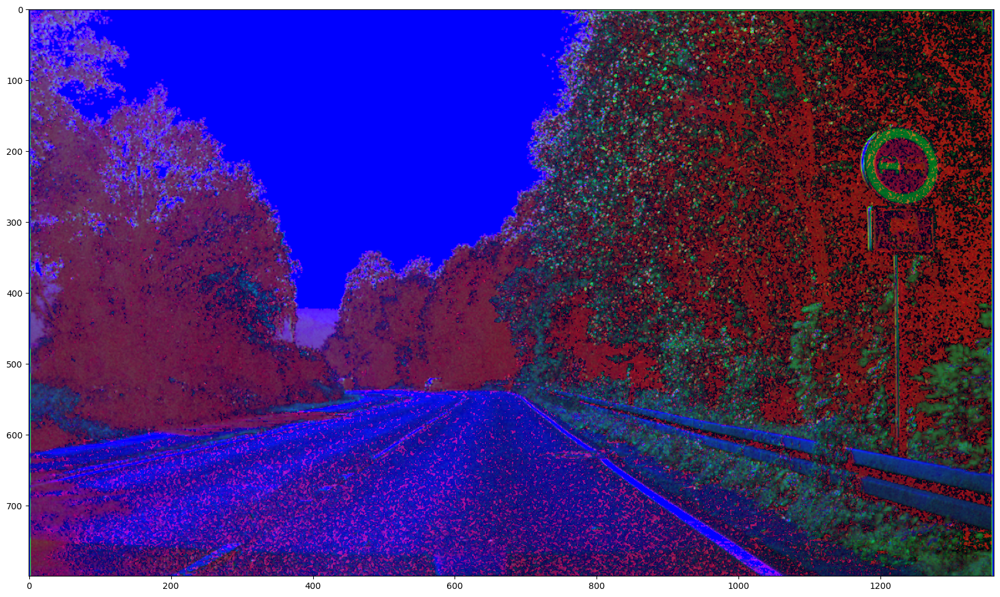

In [7]:
HSV=cv.cvtColor(im,cv.COLOR_RGB2HSV)
plt.figure(figsize=(20,20))
plt.imshow(HSV)

In [28]:
ClassID={
    0:"Speed limit (20km/h)",
    1:"Speed limit (30km/h)",
    2:"Speed limit (50km/h)",
    3:"Speed limit (60km/h)",
    4:"Speed limit (70km/h)",
    5:"Speed limit (80km/h)",
    6:"End of speed limit (80km/h)",
    7:"Speed limit (100km/h)",
    8:"Speed limit (120km/h)",
    9:"No passing",
    10:"No passing veh over 3.5 tons",

}

**Détection en utilisant l'information couleur**

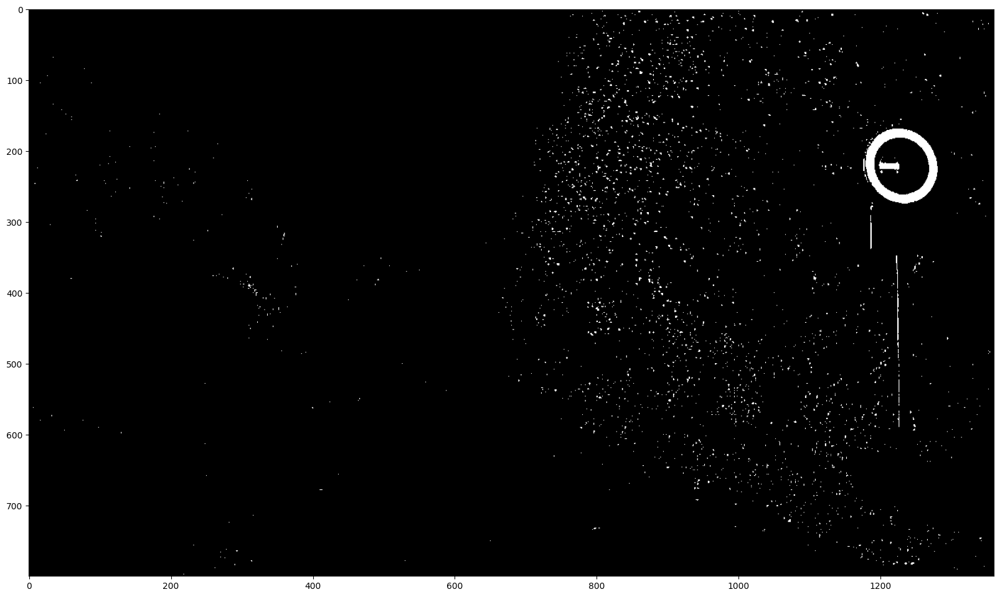

In [8]:
bin1= cv.inRange(HSV, (0,80,0), (12,255,255))
bin2= cv.inRange(HSV, (160,80,0), (180,255,255))
bin = cv.bitwise_or(bin1, bin2)
plt.figure(figsize=(20,20))
plt.imshow(bin, cmap="gray")

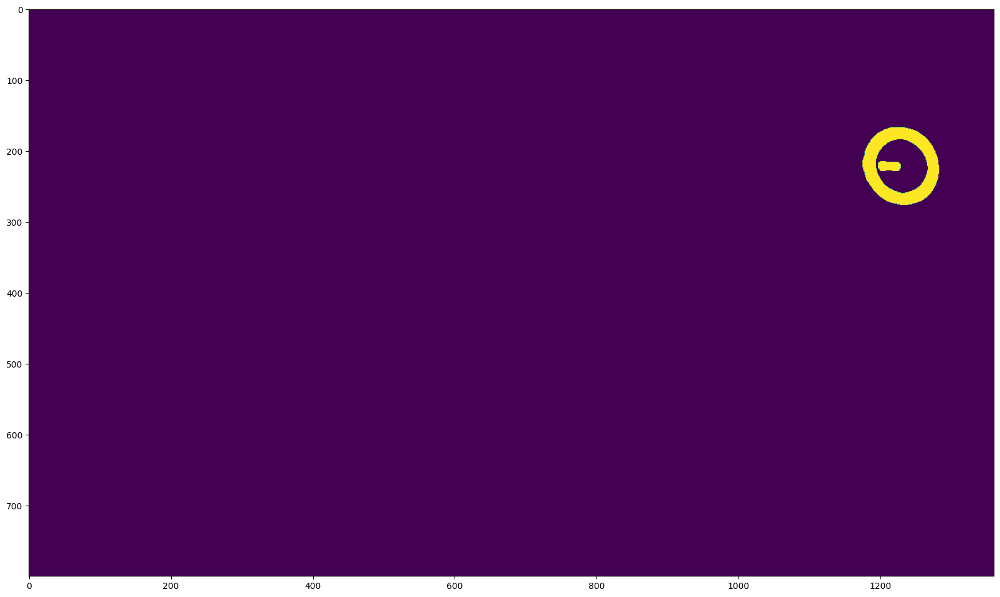

In [9]:
dst = cv.medianBlur(bin,9)
kernel = np.ones((5,5),np.uint8)
dilate_dst = cv.dilate(dst,kernel,)
plt.figure(figsize=(20,20))
plt.imshow(dilate_dst)

Number of contours : 1


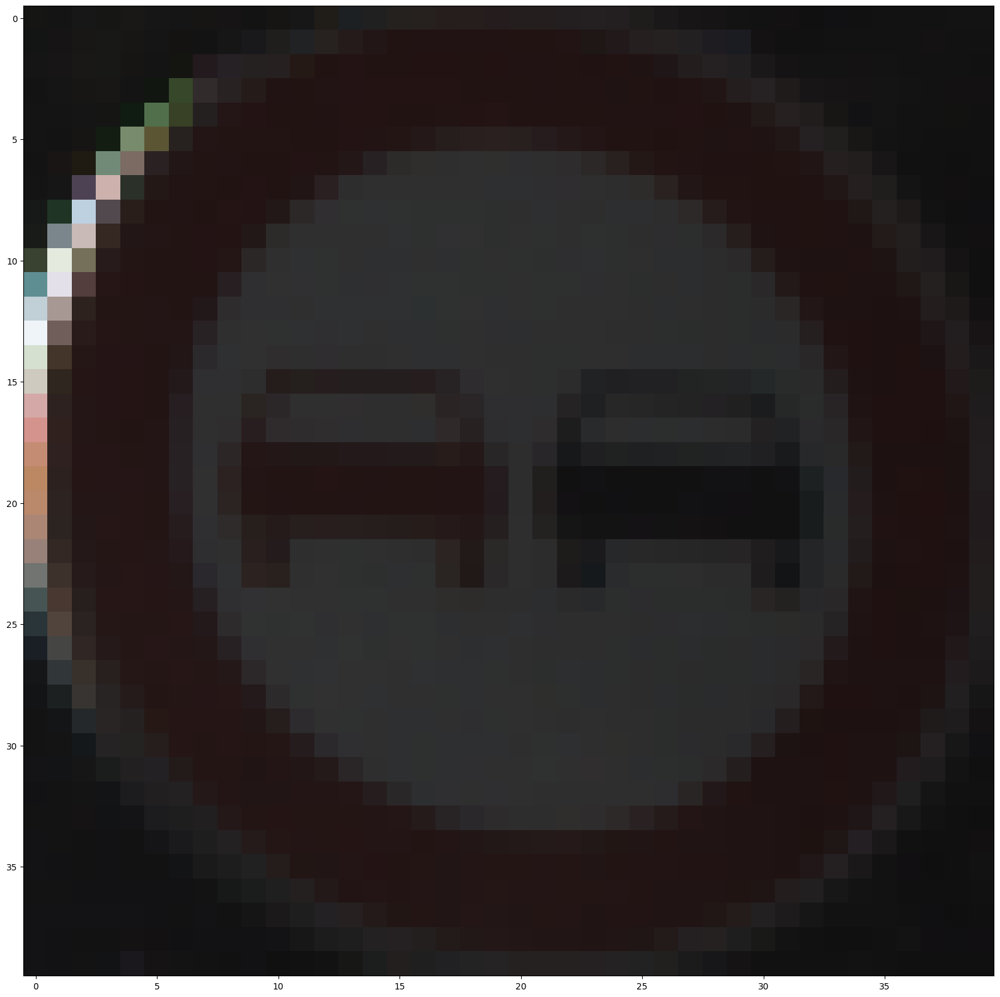

In [10]:
contours, _=cv.findContours(dilate_dst, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
Rois=[]
Rect=[]
print("Number of contours : "+str(len(contours)))
for c in contours:
    x,y,w,h = cv.boundingRect(c)
    if h>H/35 and w>W/35 and h<H/3 and w<W/3:
        roi = im[y:y+h,x:x+w]
        resized = cv.resize(roi , [40,40], interpolation= cv.INTER_AREA)
        Rois.append(resized)
        Rect.append(cv.boundingRect(c))
        plt.figure(figsize=(20,20))
        plt.imshow(Rois[0])



In [11]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import cv2 as cv
import numpy as np

Caractéristiques HOG pour Priority at next intersection (00000.ppm) : [0.05523931 0.10987291 0.0922584  0.00511294 0.25132155 0.05498061
 0.24032526 0.08827604 0.14988096 0.28615191]...


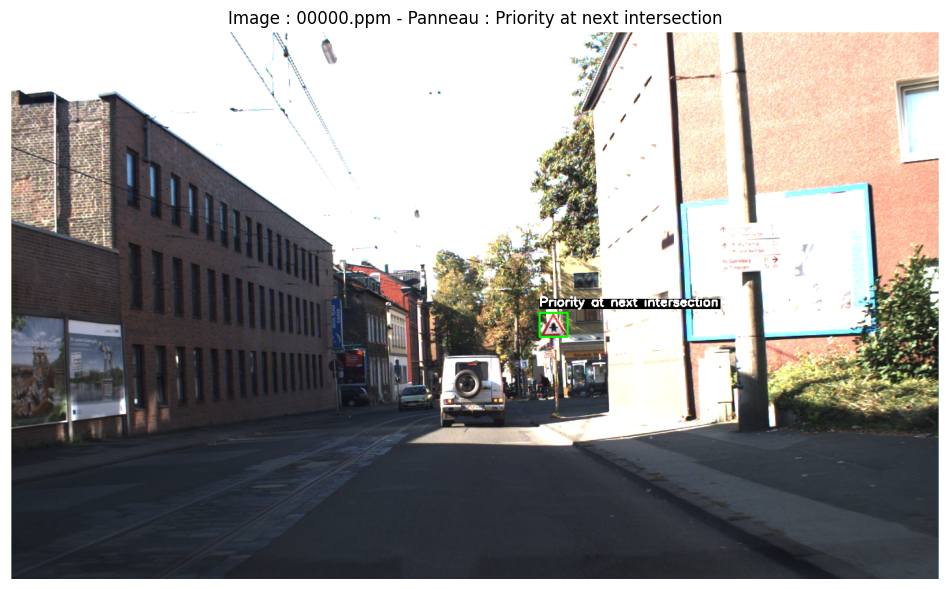

Caractéristiques HOG pour Roundabout (00001.ppm) : [0.         0.02226323 0.07859925 0.         0.00551468 0.
 0.         0.         0.         0.18653394]...


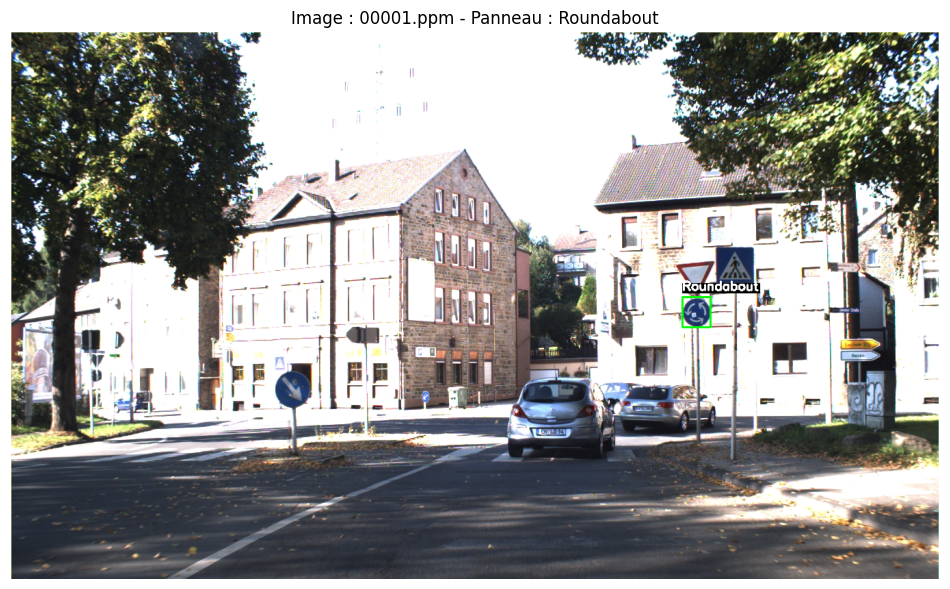

Caractéristiques HOG pour Keep right (00001.ppm) : [0.04364134 0.         0.         0.         0.08755139 0.01012404
 0.         0.         0.         0.0369848 ]...


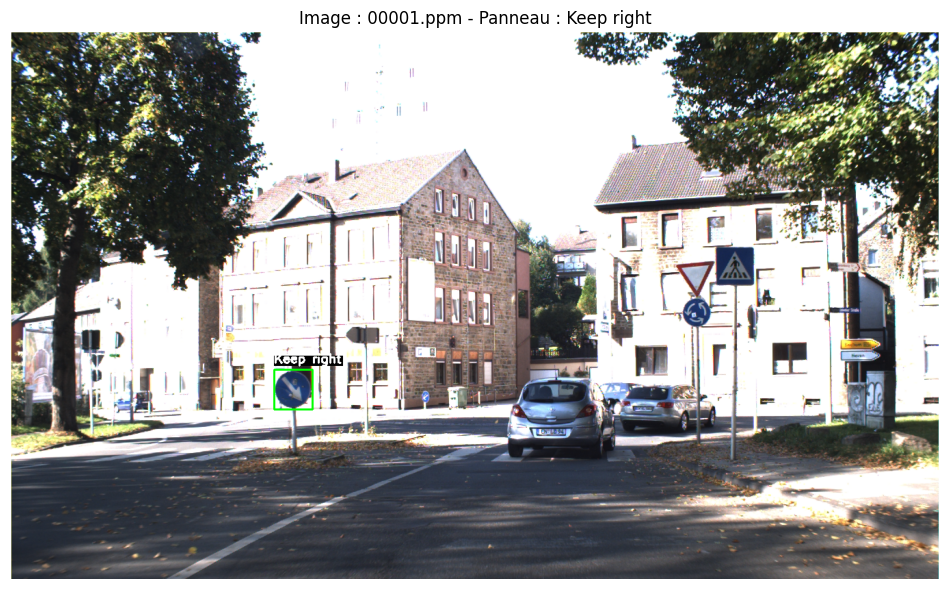

Caractéristiques HOG pour Give way (00001.ppm) : [0.03256613 0.09649534 0.12493652 0.26106149 0.33966107 0.05102192
 0.02903717 0.         0.03146554 0.00750752]...


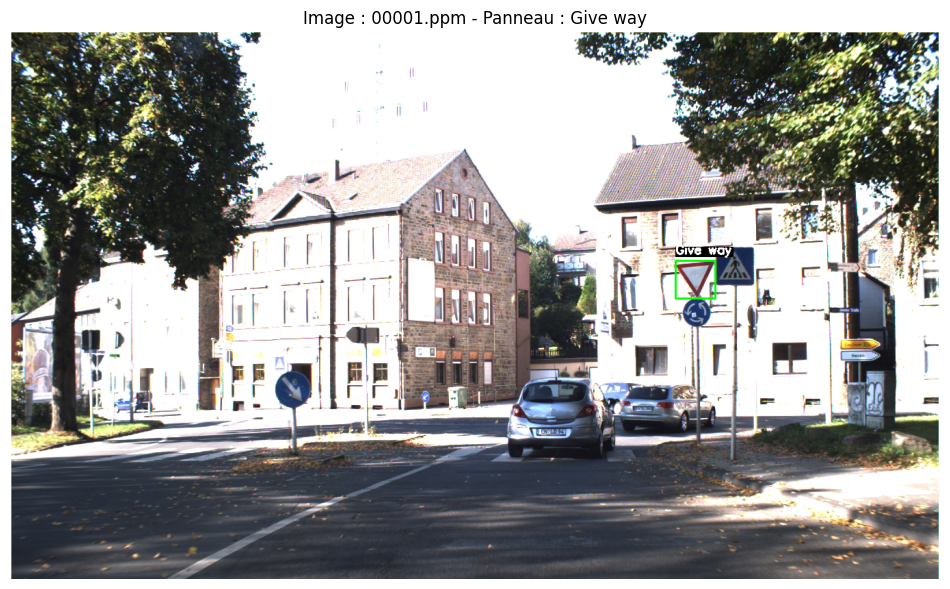

Caractéristiques HOG pour Keep left (00002.ppm) : [1.71408997e-01 0.00000000e+00 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 4.11347111e-04 6.50909566e-04
 4.20090238e-01 3.56608010e-01]...


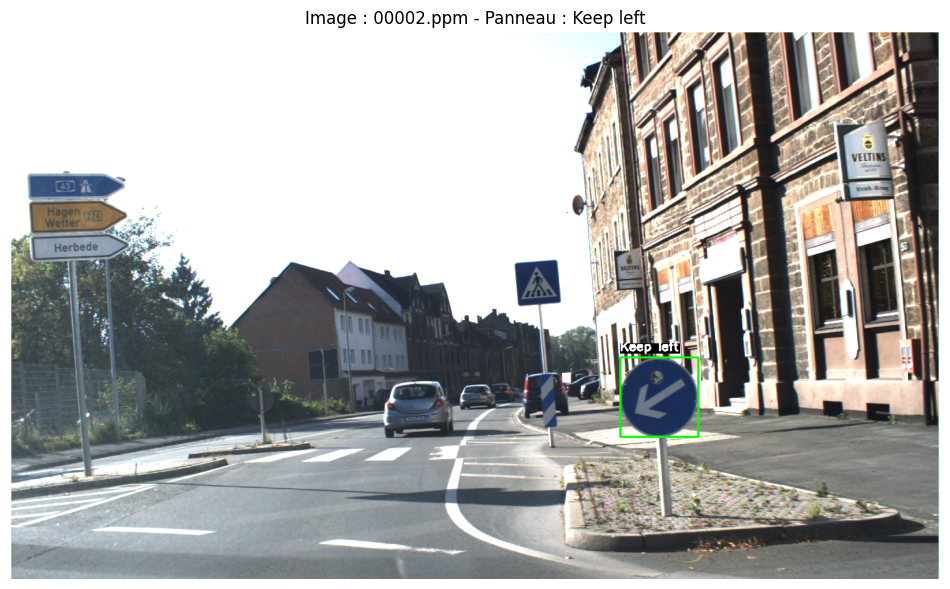

Caractéristiques HOG pour Speed limit 70 (00003.ppm) : [0.22666467 0.25525218 0.25525218 0.25525218 0.18121166 0.04506877
 0.04728504 0.02228655 0.02757182 0.03637164]...


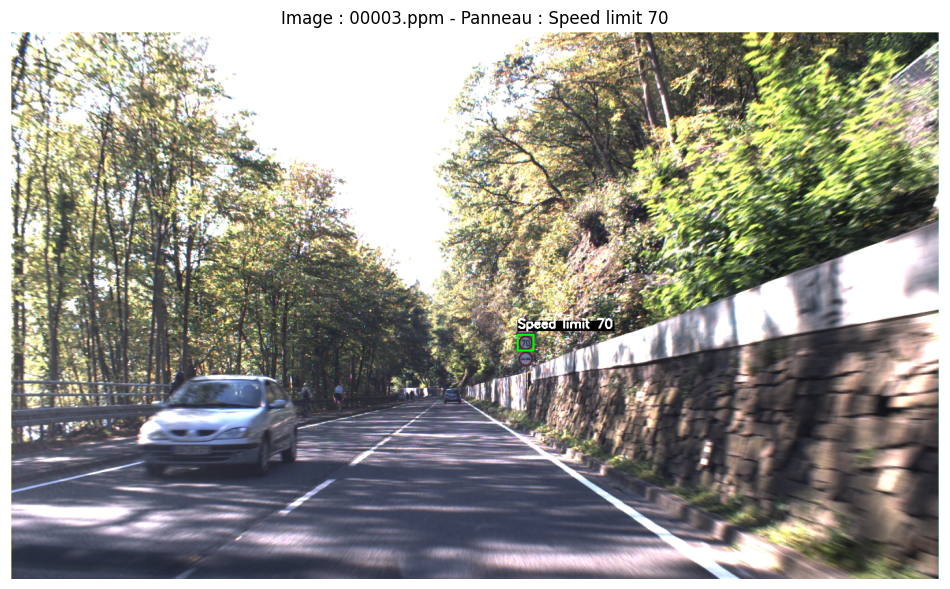

Caractéristiques HOG pour No overtaking (00003.ppm) : [0.13865717 0.28106452 0.28106452 0.10245572 0.16912498 0.02388718
 0.02259559 0.         0.05358679 0.05443529]...


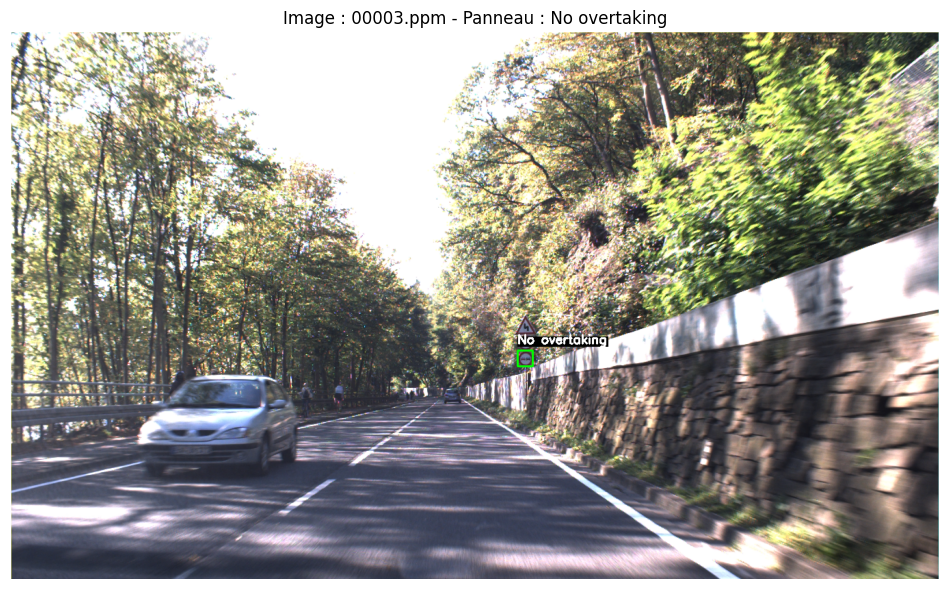

Caractéristiques HOG pour Bend (00003.ppm) : [0.19660367 0.04662424 0.27860249 0.14423672 0.16363914 0.12108435
 0.12888272 0.00095745 0.03928505 0.29420287]...


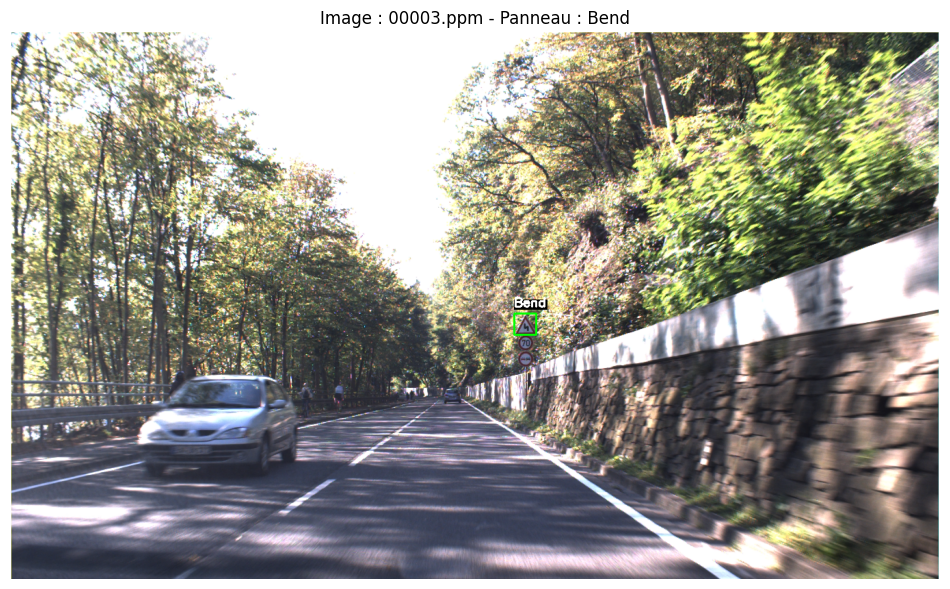

Caractéristiques HOG pour Bend (00004.ppm) : [0.23186184 0.25537152 0.25537152 0.25537152 0.17306287 0.11013858
 0.         0.05296498 0.20483076 0.21060905]...


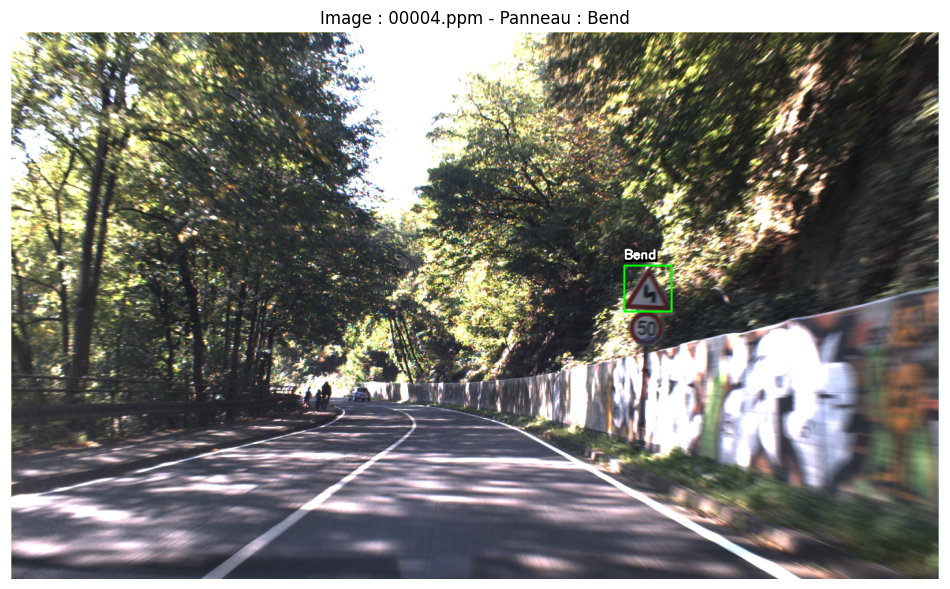

Caractéristiques HOG pour Speed limit 50 (00004.ppm) : [0.18516537 0.13147573 0.08021026 0.199369   0.13079398 0.01391649
 0.01845441 0.01613669 0.0478657  0.26254806]...


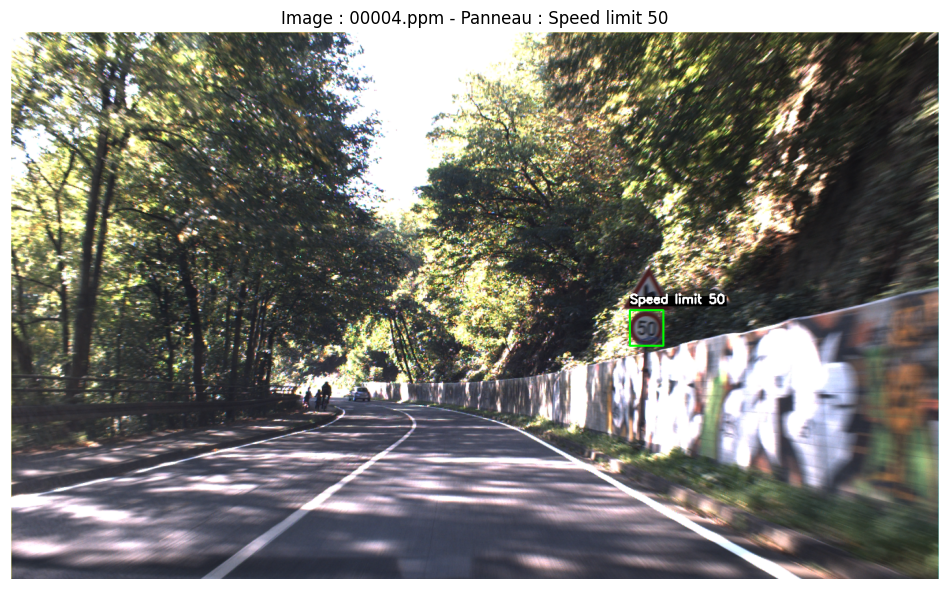

Caractéristiques HOG pour No overtaking (00005.ppm) : [0.2923911  0.2923911  0.2923911  0.14815574 0.2923911  0.08538857
 0.10860271 0.21533652 0.         0.2923911 ]...
Caractéristiques HOG pour Speed limit 50 (00006.ppm) : [0.2624985  0.01708234 0.00810041 0.12123175 0.11949167 0.06158559
 0.00809311 0.08117851 0.28909764 0.28909764]...
Caractéristiques HOG pour No overtaking (00007.ppm) : [0.29454413 0.06832389 0.15506737 0.20536088 0.18837637 0.08159858
 0.15602243 0.19420119 0.16410599 0.09458039]...
Caractéristiques HOG pour Speed limit 50 (00008.ppm) : [0.13549947 0.32041846 0.32041846 0.04429407 0.12344251 0.02127614
 0.0215573  0.02763726 0.0489048  0.16574519]...
Caractéristiques HOG pour Priority road (00008.ppm) : [0.19587677 0.01903814 0.01930863 0.16848534 0.32437454 0.08131384
 0.09434841 0.14397135 0.0706175  0.19362695]...
Caractéristiques HOG pour Speed limit 70 (00009.ppm) : [0.12292418 0.26746707 0.26746707 0.15640231 0.19022172 0.0358562
 0.01652172 0.00733176 0.00

In [19]:
import os
import cv2 as cv
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from skimage.feature import hog

# Chemins des fichiers
base_path = "TrainIJCNN2013"
annotations_path = os.path.join(base_path, "gt.txt")

# Créer le dossier "resultat" s'il n'existe pas
result_folder = "resultat"
os.makedirs(result_folder, exist_ok=True)

# Associer les classes à leurs noms
class_names = {
    0: "Speed limit 20",
    1: "Speed limit 30",
    2: "Speed limit 50",
    3: "Speed limit 60",
    4: "Speed limit 70",
    5: "Speed limit 80",
    6: "Restriction ends 80",
    7: "Speed limit 100",
    8: "Speed limit 120",
    9: "No overtaking",
    10: "No overtaking (trucks)",
    11: "Priority at next intersection",
    12: "Priority road",
    13: "Give way",
    14: "Stop",
    15: "No traffic both ways",
    16: "No trucks",
    17: "No entry",
    18: "Danger",
    19: "Bend left",
    20: "Bend right",
    21: "Bend",
    22: "Uneven road",
    23: "Slippery road",
    24: "Road narrows",
    25: "Construction",
    26: "Traffic signal",
    27: "Pedestrian crossing",
    28: "School crossing",
    29: "Cycles crossing",
    30: "Snow",
    31: "Animals",
    32: "Restriction ends",
    33: "Go right",
    34: "Go left",
    35: "Go straight",
    36: "Go right or straight",
    37: "Go left or straight",
    38: "Keep right",
    39: "Keep left",
    40: "Roundabout",
    41: "Restriction ends (overtaking)",
    42: "Restriction ends (overtaking trucks)"
}

# Charger les annotations
columns = ["filename", "left", "top", "right", "bottom", "class_id"]
annotations = pd.read_csv(annotations_path, sep=';', names=columns)

# Fonction pour extraire les caractéristiques HOG d'une ROI
def extract_hog_features(image):
    # Convertir en niveaux de gris
    gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
    # Calcul des caractéristiques HOG
    hog_features = hog(
        gray,
        orientations=9,
        pixels_per_cell=(8, 8),
        cells_per_block=(2, 2),
        block_norm='L2-Hys',
        transform_sqrt=True,
        feature_vector=True
    )
    return hog_features

# Compteur pour limiter l'affichage
display_count = 0
max_display = 10

# Parcourir les images et annotations
for _, row in annotations.iterrows():
    # Charger l'image
    image_path = os.path.join(base_path, row["filename"])
    image = cv.imread(image_path)

    if image is None:
        print(f"Image introuvable : {image_path}")
        continue

    # Extraire les coordonnées et la classe
    left, top, right, bottom, class_id = row["left"], row["top"], row["right"], row["bottom"], row["class_id"]
    panel_name = class_names.get(class_id, f"Unknown class ({class_id})")

    # Extraire la ROI (Region of Interest)
    roi = image[top:bottom, left:right]
    if roi.size == 0:
        print(f"ROI vide pour l'image : {image_path}")
        continue

    # Extraire les caractéristiques HOG
    hog_features = extract_hog_features(roi)
    print(f"Caractéristiques HOG pour {panel_name} ({row['filename']}) : {hog_features[:10]}...")  # Afficher un extrait des caractéristiques

    # Dessiner le rectangle autour du panneau
    cv.rectangle(image, (left, top), (right, bottom), (0, 255, 0), 2)

    # Ajouter le nom du panneau avec un fond semi-transparent pour améliorer la lisibilité
    font = cv.FONT_HERSHEY_SIMPLEX
    text_size = cv.getTextSize(panel_name, font, 0.6, 2)[0]
    text_w, text_h = text_size
    cv.rectangle(image, (left, max(top - 20, 0)), (left + text_w, max(top - 20, 0) + text_h), (0, 0, 0), -1)  # Fond noir
    cv.putText(image, panel_name, (left, max(top - 10, 0)), font, 0.6, (255, 255, 255), 2)  # Texte blanc

    # Convertir pour affichage avec Matplotlib (BGR -> RGB)
    image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)

    # Sauvegarder l'image annotée dans le dossier "resultat"
    result_path = os.path.join(result_folder, row["filename"])
    cv.imwrite(result_path, image)

    # Afficher uniquement les 10 premières images
    if display_count < max_display:
        plt.figure(figsize=(12, 8))
        plt.imshow(image_rgb)
        plt.axis("off")
        plt.title(f"Image : {row['filename']} - Panneau : {panel_name}")
        plt.show()
        display_count += 1

# *** Afficher les résultats sauvegardés ***

# Lister les fichiers sauvegardés dans le dossier "resultat"
result_files = [f for f in os.listdir(result_folder) if f.endswith(('.png', '.jpg', '.jpeg'))]

# Vérifier s'il y a des fichiers
if not result_files:
    print("Aucun fichier sauvegardé dans le dossier 'resultat'.")
else:
    print(f"Affichage des résultats sauvegardés : {len(result_files)} fichiers trouvés.")
    for image_name in result_files:
        result_path = os.path.join(result_folder, image_name)
        image = cv.imread(result_path)

        if image is None:
            print(f"Impossible de charger l'image sauvegardée : {result_path}")
            continue

        # Convertir en RGB pour l'affichage avec Matplotlib
        image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)

        # Afficher l'image
        plt.figure(figsize=(8, 6))
        plt.imshow(image_rgb)
        plt.axis("off")
        plt.title(f"Résultat sauvegardé : {image_name}")
        plt.show()


In [20]:
import os
import cv2 as cv
import pandas as pd

# Répertoires et fichiers de travail
base_path = "TrainIJCNN2013"
annotations_path = os.path.join(base_path, "gt.txt")
output_dir = "processed_data"

# Création du dossier de sortie si inexistant
os.makedirs(output_dir, exist_ok=True)

# Chargement des annotations
annotations = pd.read_csv(annotations_path, sep=";", names=["filename", "left", "top", "right", "bottom", "class_id"])

def process_and_save_roi(image_path, roi, class_id, filename):
    """Fonction pour traiter et enregistrer les ROI"""
    # Redimensionnement de la ROI
    resized_roi = cv.resize(roi, (40, 40), interpolation=cv.INTER_AREA)

    # Création du répertoire pour la classe, s'il n'existe pas
    class_dir = os.path.join(output_dir, str(class_id))
    os.makedirs(class_dir, exist_ok=True)

    # Enregistrement de la ROI redimensionnée avec le nom de fichier
    save_path = os.path.join(class_dir, f"{filename}.jpg")
    cv.imwrite(save_path, resized_roi)

# Traitement des annotations et enregistrement des ROIs
for idx, row in annotations.iterrows():
    image_path = os.path.join(base_path, row["filename"])
    image = cv.imread(image_path)

    if image is None:
        continue

    # Extraire la région d'intérêt (ROI)
    left, top, right, bottom, class_id = row["left"], row["top"], row["right"], row["bottom"], row["class_id"]
    roi = image[top:bottom, left:right]

    # Vérifier si la ROI n'est pas vide
    if roi.size == 0:
        continue

    # Appeler la fonction pour traiter et enregistrer la ROI
    process_and_save_roi(image_path, roi, class_id, row["filename"])

print("Traitement des données terminé avec succès.")


Traitement des données terminé avec succès.


In [21]:
import os
import cv2 as cv
import numpy as np
import glob
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from skimage.feature import hog
from sklearn.metrics import classification_report
import joblib

# Répertoire des données traitées
processed_data_dir = "processed_data"

# Liste pour stocker les caractéristiques et les étiquettes
features_data = []
labels_data = []

# Charger les données
for class_dir in os.listdir(processed_data_dir):
    class_path = os.path.join(processed_data_dir, class_dir)
    for img_path in glob.glob(f"{class_path}/*.jpg"):
        # Charger l'image en niveaux de gris
        img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)
        if img is None:
            continue

        # Extraire les caractéristiques HOG
        hog_features = hog(
            img,
            orientations=9,
            pixels_per_cell=(8, 8),
            cells_per_block=(2, 2),
            block_norm='L2-Hys',
            transform_sqrt=True,
            feature_vector=True
        )

        # Ajouter les caractéristiques et l'étiquette (class_id) à la liste
        features_data.append(hog_features)
        labels_data.append(int(class_dir))

# Convertir en tableaux numpy
features_data = np.array(features_data)
labels_data = np.array(labels_data)

# Diviser les données en ensemble d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(features_data, labels_data, test_size=0.2, random_state=42)

# Entraîner le modèle SVM
svm_model = SVC(kernel='linear', probability=True)
svm_model.fit(X_train, y_train)

# Prédictions et évaluation du modèle
predictions = svm_model.predict(X_test)
print(classification_report(y_test, predictions))

# Sauvegarder le modèle entraîné
joblib.dump(svm_model, "road_sign_classifier.pkl")
print("Le modèle a été sauvegardé sous le nom 'road_sign_classifier.pkl'.")


              precision    recall  f1-score   support

           1       0.67      0.83      0.74        12
           2       0.71      1.00      0.83         5
           3       1.00      0.83      0.91         6
           4       0.75      1.00      0.86         3
           5       0.88      0.88      0.88         8
           6       1.00      1.00      1.00         1
           7       1.00      0.83      0.91         6
           8       0.80      0.67      0.73         6
           9       0.75      1.00      0.86         3
          10       1.00      1.00      1.00         9
          11       0.33      1.00      0.50         2
          12       1.00      1.00      1.00         7
          13       1.00      1.00      1.00         6
          14       1.00      1.00      1.00         4
          15       1.00      1.00      1.00         2
          16       1.00      0.50      0.67         2
          17       1.00      1.00      1.00         1
          18       1.00    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Modèle chargé avec succès.


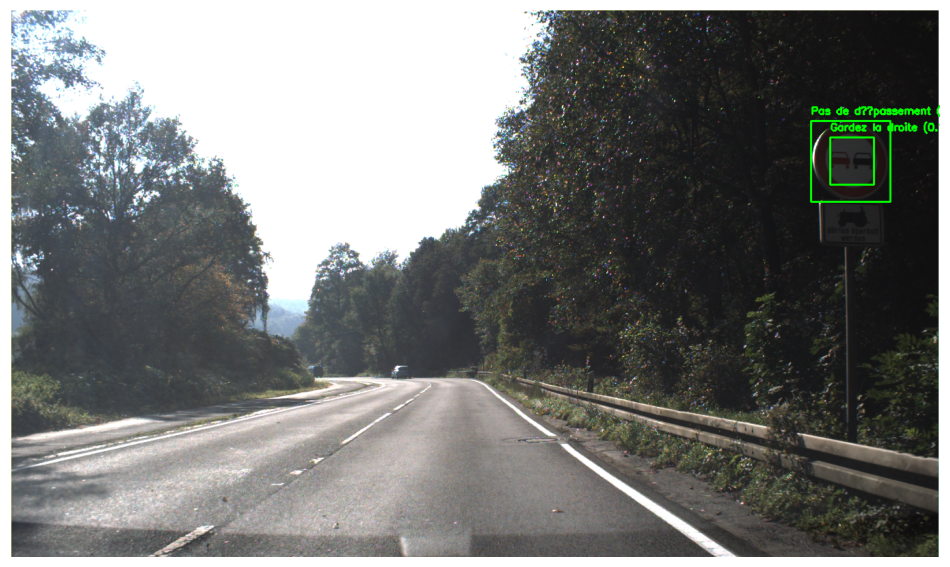

In [27]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
from skimage.feature import hog
from sklearn.svm import SVC
import os
import glob
import joblib

# Fonction d'entraînement du modèle SVM personnalisé avec les caractéristiques HOG
def create_svm_model(dataset_dir):
    feature_list = []
    label_list = []

    # Charger toutes les images étiquetées et extraire les caractéristiques HOG
    for class_folder in os.listdir(dataset_dir):
        class_folder_path = os.path.join(dataset_dir, class_folder)
        for img_path in glob.glob(f"{class_folder_path}/*.jpg"):
            img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)
            if img is None:
                continue

            # Extraire les caractéristiques HOG
            feature = hog(
                img,
                orientations=9,
                pixels_per_cell=(8, 8),
                cells_per_block=(2, 2),
                block_norm='L2-Hys',
                transform_sqrt=True,
                feature_vector=True
            )
            feature_list.append(feature)
            label_list.append(int(class_folder))

    # Entraîner le modèle SVM avec un noyau linéaire
    model = SVC(kernel='linear', probability=True)
    model.fit(np.array(feature_list), np.array(label_list))
    print("Entraînement du modèle terminé.")
    return model

# Fonction pour détecter et classifier les panneaux de signalisation dans une image
def detect_and_classify_signs(image, model, class_labels):
    # Conversion de l'image en HSV
    hsv_image = cv.cvtColor(image, cv.COLOR_BGR2HSV)

    # Détection de couleurs spécifiques pour les panneaux (jaune et rouge par exemple)
    mask1 = cv.inRange(hsv_image, (0, 80, 0), (12, 255, 255))  # Jaune
    mask2 = cv.inRange(hsv_image, (160, 80, 0), (180, 255, 255))  # Rouge
    combined_mask = cv.bitwise_or(mask1, mask2)

    # Appliquer un flou pour réduire le bruit
    blurred_mask = cv.medianBlur(combined_mask, 9)

    # Transformation morphologique pour mieux délimiter les contours
    kernel = np.ones((7, 7), np.uint8)  # Augmentation de la taille du noyau
    dilated_mask = cv.dilate(blurred_mask, kernel, iterations=2)  # Augmentation du nombre d'itérations

    # Trouver les contours dans l'image traitée
    contours, _ = cv.findContours(dilated_mask, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

    for contour in contours:
        x, y, w, h = cv.boundingRect(contour)

        # Modifier les seuils de taille pour détecter plus de panneaux
        if h > image.shape[0] / 100 and w > image.shape[1] / 100 and h < image.shape[0] / 3 and w < image.shape[1] / 3:
            roi = image[y:y+h, x:x+w]
            resized_roi = cv.resize(roi, (40, 40), interpolation=cv.INTER_AREA)
            gray_roi = cv.cvtColor(resized_roi, cv.COLOR_BGR2GRAY)

            # Extraire les caractéristiques HOG du ROI
            feature = hog(
                gray_roi,
                orientations=9,
                pixels_per_cell=(8, 8),
                cells_per_block=(2, 2),
                block_norm='L2-Hys',
                transform_sqrt=True,
                feature_vector=True
            ).reshape(1, -1)

            # Prédire la classe du panneau
            prediction = model.predict(feature)[0]
            probability = model.predict_proba(feature).max()

            # Annoter l'image avec la classe prédite
            label = f"{class_labels.get(prediction, 'Inconnu')} ({probability:.2f})"
            cv.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)
            cv.putText(image, label, (x, y-10), cv.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Afficher l'image annotée
    plt.figure(figsize=(12, 8))
    plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()

# Répertoire des données et noms des classes
dataset_directory = "processed_data"
labels_map = {
    0: "Limite de vitesse 20",
    1: "Limite de vitesse 30",
    2: "Limite de vitesse 50",
    3: "Limite de vitesse 60",
    4: "Limite de vitesse 70",
    5: "Limite de vitesse 80",
    6: "Fin de restriction 80",
    7: "Limite de vitesse 100",
    8: "Limite de vitesse 120",
    9: "Pas de dépassement",
    10: "Pas de dépassement (camions)",
    11: "Priorité au prochain croisement",
    12: "Route prioritaire",
    13: "Cédez le passage",
    14: "Stop",
    15: "Pas de circulation dans les deux sens",
    16: "Pas de camions",
    17: "Interdiction d'entrée",
    18: "Danger",
    19: "Virage à gauche",
    20: "Virage à droite",
    21: "Virage",
    22: "Route inégale",
    23: "Route glissante",
    24: "Réduction de largeur de route",
    25: "Construction",
    26: "Signalisation lumineuse",
    27: "Passage piéton",
    28: "Passage école",
    29: "Passage vélos",
    30: "Neige",
    31: "Animaux",
    32: "Fin de restriction",
    33: "Tournez à droite",
    34: "Tournez à gauche",
    35: "Allez tout droit",
    36: "Allez à droite ou tout droit",
    37: "Allez à gauche ou tout droit",
    38: "Gardez la droite",
    39: "Gardez la gauche",
    40: "Rond-point",
    41: "Fin de restriction (dépassement)",
    42: "Fin de restriction (camions)"
}

# Entraîner le modèle ou le charger s'il existe déjà
model_filename = "road_sign_classifier.pkl"
if os.path.exists(model_filename):
    classifier = joblib.load(model_filename)
    print("Modèle chargé avec succès.")
else:
    classifier = create_svm_model(dataset_directory)
    joblib.dump(classifier, model_filename)
    print("Modèle enregistré.")

# Tester avec une image d'exemple
test_image_path = "/content/TrainIJCNN2013/00005.ppm"
image_to_test = cv.imread(test_image_path)

if image_to_test is not None:
    detect_and_classify_signs(image_to_test, classifier, labels_map)
else:
    print(f"Image de test introuvable : {test_image_path}")
